In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import plotly.express as px
import plotly.graph_objects as go
import os
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected= True)
cf.go_offline()

C:\Users\bayunugrozzz\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning:

Blowfish has been deprecated



In [2]:
os.getcwd()

'C:\\Users\\bayunugrozzz\\Documents\\datasets\\Retail Data Analytics'

## 1. DATA CLEANING

### 1.0 DATA SHAPING AND COLUMNS BREAKDOWN

In [3]:
dffetures = pd.read_csv('Feat_ds.csv')
dfsales = pd.read_csv('sales_sd.csv')
dfstore = pd.read_csv('stores_sd.csv')

features = dffetures.shape
sales = dfsales.shape
store = dfstore.shape

print("features shape:")
print(features)
print("\n\nsales shape:")
print(sales)
print("\n\nstore shape:")
print(store)

features shape:
(8190, 12)


sales shape:
(421570, 5)


store shape:
(45, 3)


In [4]:
features = dffetures.head()
sales = dfsales.head()
store = dfstore.head()

print("features columns:")
print(features)
print("\n\nsales columns:")
print(sales)
print("\n\nstore columns:")
print(store)

features columns:
   Store        Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
0      1  05/02/2010        42.31       2.572        NaN        NaN   
1      1  12/02/2010        38.51       2.548        NaN        NaN   
2      1  19/02/2010        39.93       2.514        NaN        NaN   
3      1  26/02/2010        46.63       2.561        NaN        NaN   
4      1  05/03/2010        46.50       2.625        NaN        NaN   

   MarkDown3  MarkDown4  MarkDown5         CPI  Unemployment  IsHoliday  
0        NaN        NaN        NaN  211.096358         8.106      False  
1        NaN        NaN        NaN  211.242170         8.106       True  
2        NaN        NaN        NaN  211.289143         8.106      False  
3        NaN        NaN        NaN  211.319643         8.106      False  
4        NaN        NaN        NaN  211.350143         8.106      False  


sales columns:
   Store  Dept        Date  Weekly_Sales  IsHoliday
0      1     1  05/02/2010      24924.50  

### 1.1 MERGE DATA FRAME

In [5]:
df = pd.merge(dfsales, dffetures, on=['Store', 'Date'], how='inner')
df = pd.merge(df, dfstore, on='Store', how='inner')
sample = df.sample(5)
shape = df.shape

print("data shape(merge result):")
print(shape)

data shape(merge result):
(421570, 17)


In [6]:
df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday_x', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'IsHoliday_y', 'Type', 'Size'],
      dtype='object')

In [7]:
df.rename(columns= lambda x: x.lower(), inplace = True)
df.head()

,store,dept,date,weekly_sales,isholiday_x,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,cpi,unemployment,isholiday_y,type,size
0,1,1,05/02/2010,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
1,1,2,05/02/2010,50605.27,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
2,1,3,05/02/2010,13740.12,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
3,1,4,05/02/2010,39954.04,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
4,1,5,05/02/2010,32229.38,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315


### 1.2 MISSING VALUE AND DUPLICATED DATA

In [8]:
df['weekly_sales'].sum()

6737218987.11

In [9]:
## chek duplicated data
dup =df.duplicated().sum()
print("The amount of duplicated data : ", dup)

The amount of duplicated data :  0


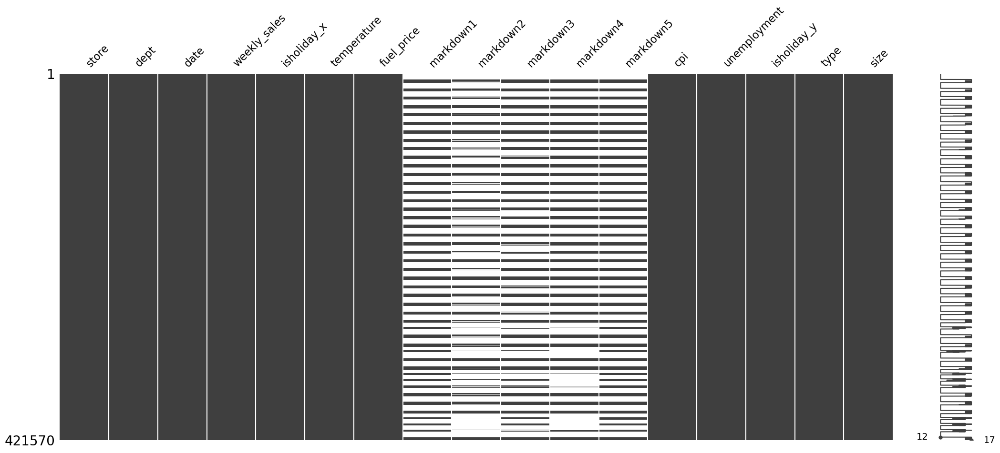

<Figure size 1000x600 with 0 Axes>

In [10]:
msno.matrix(df)

plt.figure(figsize=(10, 6))
plt.savefig('missing_value_matrix.png', dpi=300, bbox_inches='tight')


<Axes: >

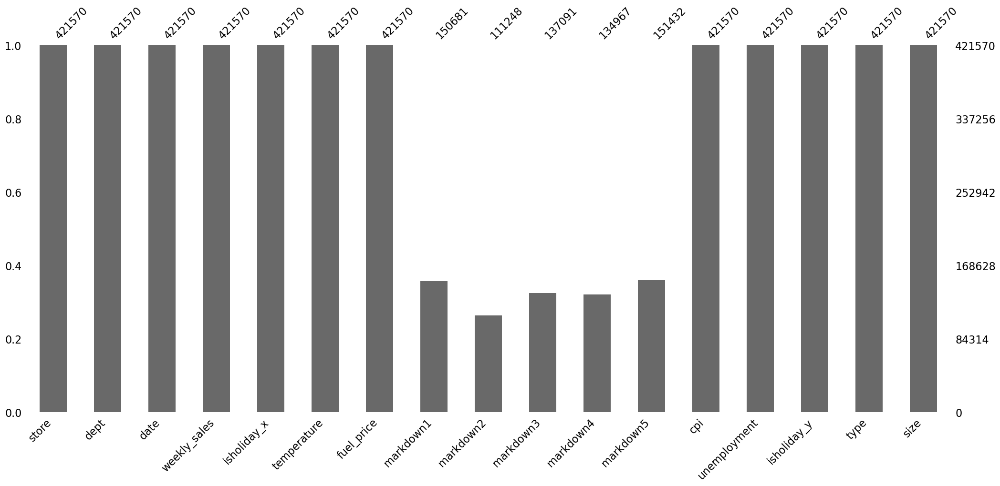

In [11]:
msno.bar(df)

- Missing values are commonly observed in the markdown variable, which signifies special promotions conducted by the company during holidays such as the Super Bowl, Labor Day, Thanksgiving, and Christmas. Therefore, there is no need to exclude this variable from the dataset.
- Based on the missing value matrix, it appears that markdown events are frequently conducted together or concurrently. 

----------------------------------------------------------------------------------------------------------------------------------
- Nilai yang hilang seringkali teramati dalam variabel markdown, yang menandakan promosi khusus yang dilakukan oleh perusahaan selama liburan seperti Super Bowl, Hari Buruh, Thanksgiving, dan Natal. Oleh karena itu, tidak perlu mengeluarkan variabel ini dari kumpulan data.
- terlihat dari missing value matrix, event markdown sering di adakan bersamaan.

### 1.3 DATA TYPES AND VALUE UNDERSTANDING(MIN,MAX, UNIQUE VALUE)

In [12]:
for dtype, col in (list(zip(df.dtypes, df.columns))):
    if dtype == 'int64' or dtype == 'float64':
        print(col, dtype)
        print(df[col].min(), df[col].max())
    else :
        print(col, dtype)
        print(df[col].unique())
    
    print()

store int64
1 45

dept int64
1 99

date object
['05/02/2010' '12/02/2010' '19/02/2010' '26/02/2010' '05/03/2010'
 '12/03/2010' '19/03/2010' '26/03/2010' '02/04/2010' '09/04/2010'
 '16/04/2010' '23/04/2010' '30/04/2010' '07/05/2010' '14/05/2010'
 '21/05/2010' '28/05/2010' '04/06/2010' '11/06/2010' '18/06/2010'
 '25/06/2010' '02/07/2010' '09/07/2010' '16/07/2010' '23/07/2010'
 '30/07/2010' '06/08/2010' '13/08/2010' '20/08/2010' '27/08/2010'
 '03/09/2010' '10/09/2010' '17/09/2010' '24/09/2010' '01/10/2010'
 '08/10/2010' '15/10/2010' '22/10/2010' '29/10/2010' '05/11/2010'
 '12/11/2010' '19/11/2010' '26/11/2010' '03/12/2010' '10/12/2010'
 '17/12/2010' '24/12/2010' '31/12/2010' '07/01/2011' '14/01/2011'
 '21/01/2011' '28/01/2011' '04/02/2011' '11/02/2011' '18/02/2011'
 '25/02/2011' '04/03/2011' '11/03/2011' '18/03/2011' '25/03/2011'
 '01/04/2011' '08/04/2011' '15/04/2011' '22/04/2011' '29/04/2011'
 '06/05/2011' '13/05/2011' '20/05/2011' '27/05/2011' '03/06/2011'
 '10/06/2011' '17/06/2011' '2

- The data type of the Date column is still not the same as it should have the DateTime data type
- There is an anomaly in the temprature column where there is a store that has an average temperature of 100 degrees which could be an anomaly and needs to be checked.
----------------------------------------------------------------------------------------------------------------------------------
- Jenis data dari kolom Tanggal (Date) masih belum sama seperti seharusnya karena seharusnya memiliki jenis data DateTime.
- Terdapat anomali dalam kolom suhu (temperature) di mana terdapat sebuah toko yang memiliki suhu rata-rata 100 derajat, yang mungkin merupakan sebuah anomali dan perlu diperiksa karena jika satuan yang di gunakan adalah celcius maka itu adalah anomaly.

#### 1.3.1 change data types 

In [13]:
## change dtype
df['date'] = pd.to_datetime(df['date'])
df.dtypes

store                    int64
dept                     int64
date            datetime64[ns]
weekly_sales           float64
isholiday_x               bool
temperature            float64
fuel_price             float64
markdown1              float64
markdown2              float64
markdown3              float64
markdown4              float64
markdown5              float64
cpi                    float64
unemployment           float64
isholiday_y               bool
type                    object
size                     int64
dtype: object

### 1.4 FEATURE EXTRACTION

In [14]:
##add years amount colom
df['years_amount'] = df['date'].dt.year
df['month_amount'] = df['date'].dt.month
df['years_amount'] = df['years_amount'].astype('object')

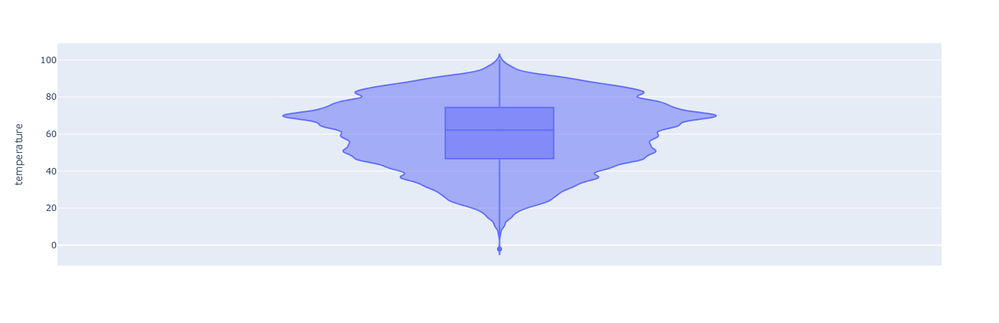

In [15]:
fig = px.violin(df, y='temperature', box=True)
fig.update_layout(autosize=False)

The average temperature of the region close to 100 is a normal temperature seen from the violint plot so it is not an anomaly.

---------------------------------------------------------------------------------------------------------------------------------

Rata-rata suhu di wilayah yang mendekati 100 adalah suhu normal yang terlihat dari plot violin, sehingga bukanlah sebuah anomal bisa jadi data temprature menggunakan fahrenheit..

## 2. DATA UNDERSTANDING

### 2.1 numeric understanding

In [16]:
df['isholiday_y'] = df['isholiday_y'].astype(int)
df['isholiday_x'] = df['isholiday_x'].astype(int)

#### 2.2.1 BOXPLOT (anomaly checking)

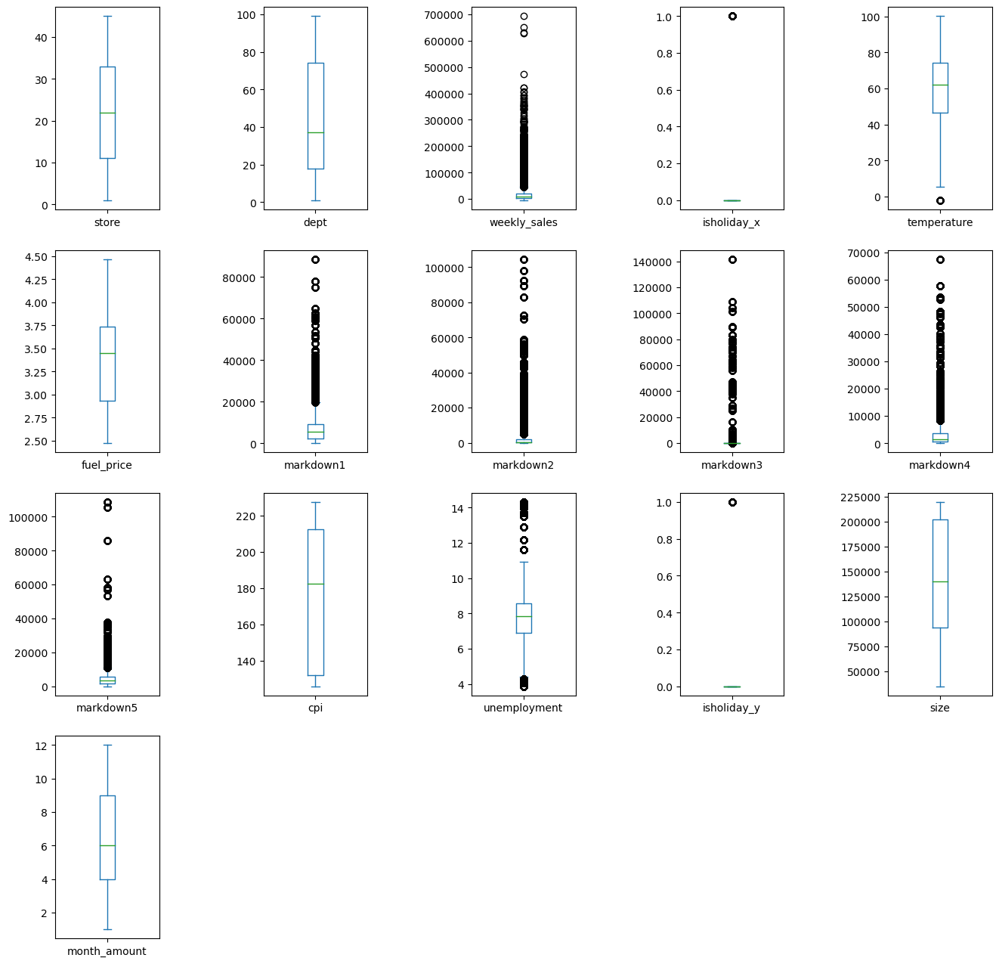

In [17]:


number = df.select_dtypes(include= ['float', 'int'])
number.plot(subplots=True, kind='box', layout=(4,5), figsize=(16,16))
plt.subplots_adjust(wspace=1)

The data still looks quite normal and there are no anomalies..

---------------------------------------------------------------------------------------------------------------------------------

Dataframe masih terlihat cukup normal dan tidak ada anomali.

#### 2.2.2 HISTOGRAM (distribution checking)

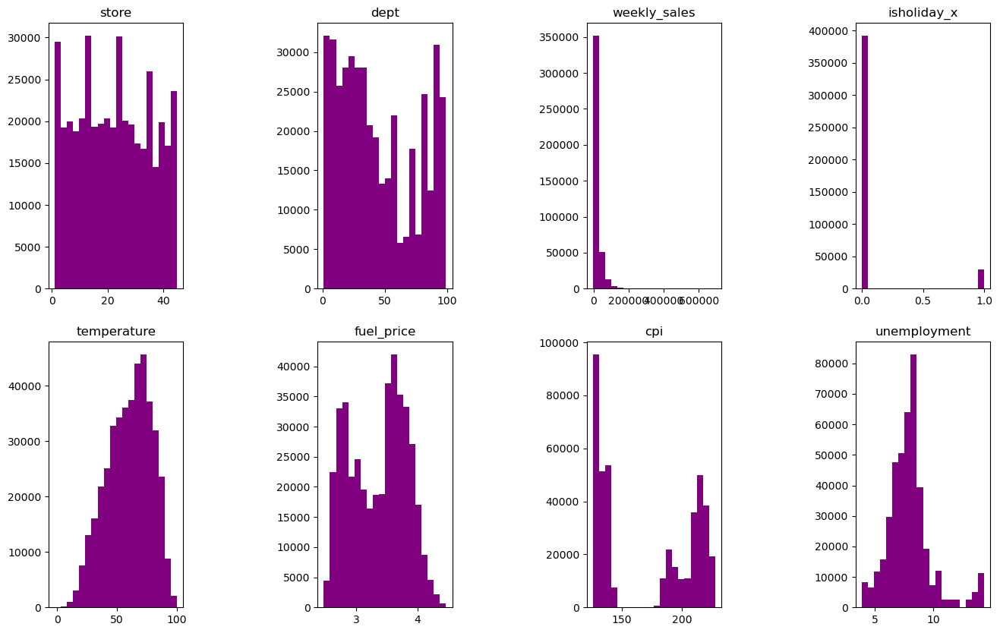

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 10))
plt.subplots_adjust(wspace=1)
columns_to_plot = [col for col in number.columns if "markdown" not in col]

for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        col_name = columns_to_plot[i]
        ax.hist(number[col_name], bins=20, color='purple')
        ax.set_title(col_name)

plt.savefig('histograms.png', dpi=300, bbox_inches='tight')


From the histogram above, we can analyze the distribution of features with numeric data types. Here are the insights that can be drawn from the histogram:

- The significant gap in the CPI column suggests that there is a wide difference in CPI values among different regions.

- The histogram for the unemployment rate shows a distribution that resembles a normal distribution but is slightly skewed to the right. This means that while the distribution is somewhat symmetric, it tends to have a longer tail on the right side. In this context, it implies that the unemployment rate in the dataset is generally higher but still follows a relatively balanced pattern around the mean.

---------------------------------------------------------------------------------------------------------------------------------
Dari histogram di atas, kita dapat menganalisis distribusi fitur-fitur dengan jenis data numerik. Berikut adalah wawasan yang dapat diperoleh dari histogram tersebut:

- terdapat gap yang jauh dari column cpi, ini menandakan bahwa terdapat perbedaan yang jauh dari cpi antar daerah.

- Histogram untuk tingkat pengangguran (unemployment rate) menunjukkan distribusi yang menyerupai distribusi normal namun sedikit condong ke kanan. Hal ini berarti bahwa sementara distribusi tersebut agak simetris, namun cenderung memiliki ekor yang lebih panjang di sisi kanan. Dalam konteks ini, ini mengimplikasikan bahwa tingkat pengangguran dalam dataset umumnya lebih tinggi tetapi masih mengikuti pola yang relatif seimbang di sekitar mean.

#### 2.2.3 CORRELATION MATRIX (relation checking)


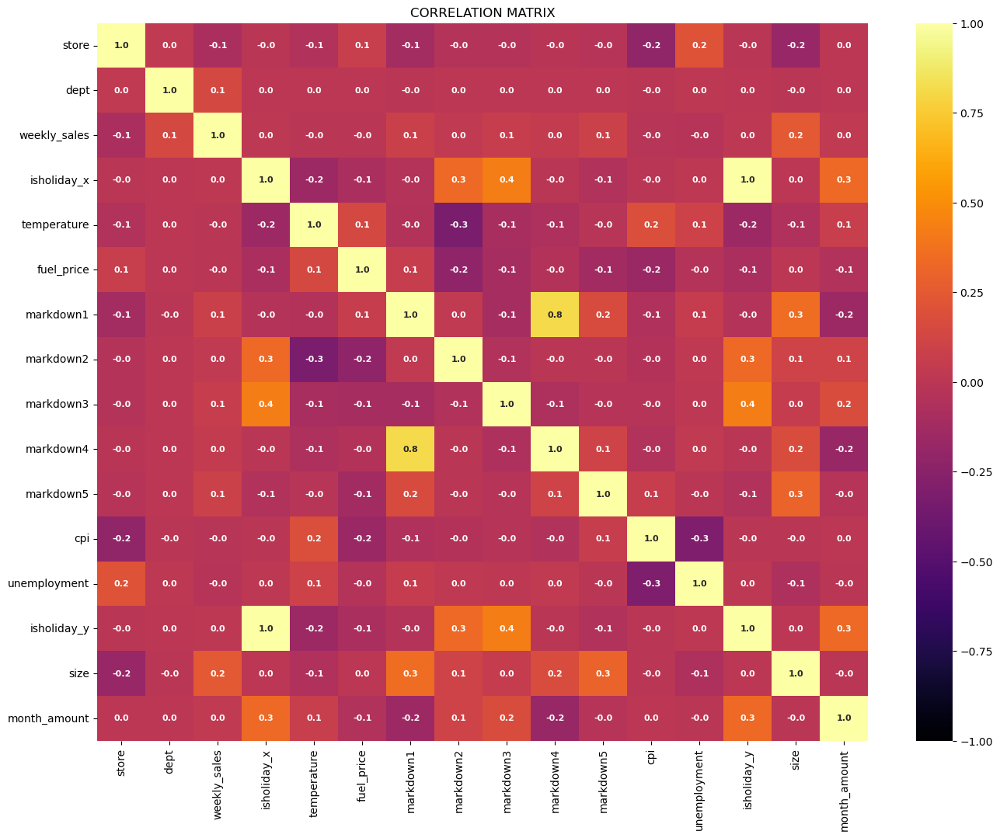

In [19]:
plt.figure(figsize=(16, 12))
sns.heatmap(number.corr(),
            vmin=-1,
            vmax=1,
            center=0,
            cmap='inferno',
            annot=True,
            fmt='.1f',
            annot_kws=dict(size=8, weight='bold'),
            linecolor='black')
plt.title('CORRELATION MATRIX')
plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.savefig('cormatrix.png', dpi=300, bbox_inches='tight')
plt.show()

- The correlation matrix above provides insights into the relationships between variables. While there aren't any particularly strong relationships, I will focus on identifying significant relationships with relatively strong correlations.

- There appears to be a relationship between the variable ISHOLIDAY and Markdown 2 and 3, suggesting that price promotions or campaigns associated with Markdown 2 and 3 are often conducted during holidays.

- Another observed relationship is between the variable size and markdowns 1, 4, and 5. This suggests that promotional activities and events related to markdowns 1, 4, and 5 are more commonly held in larger-sized stores.

- A relationship is also evident between CPI and the unemployment rate. When the unemployment rate increases, the CPI rate tends to decrease.

- A strong relationship is observed between Markdown 1 and Markdown 4, indicating potential similarities or commonalities in the events associated with these markdowns.

----------------------------------------------------------------------------------------------------------------------------------
- Matriks korelasi di atas memberikan pemahaman mengenai hubungan antar variabel. Meskipun tidak ada hubungan yang sangat kuat, kita akan berfokus pada mengidentifikasi hubungan yang signifikan dengan korelasi yang cukup kuat.

- Terdapat hubungan yang terlihat antara variabel ISHOLIDAY dengan Markdown 2 dan 3, menunjukkan bahwa promosi harga atau kampanye yang terkait dengan Markdown 2 dan 3 seringkali dilakukan selama hari libur.

- Hubungan lain yang dapat diamati adalah antara ukuran toko (size) dengan markdowns 1, 4, dan 5. Ini menunjukkan bahwa aktivitas promosi dan peristiwa terkait dengan markdowns 1, 4, dan 5 lebih sering diadakan di toko-toko yang lebih besar.

- Terlihat juga hubungan antara CPI dan tingkat pengangguran (unemployment rate). Ketika tingkat pengangguran meningkat, tingkat CPI cenderung menurun.

- Terdapat hubungan yang kuat antara Markdown 1 dan Markdown 4, yang mengindikasikan kemungkinan adanya kesamaan atau unsur yang serupa dalam peristiwa yang terkait dengan markdown ini.

#### 2.2 DATA INSIGHT

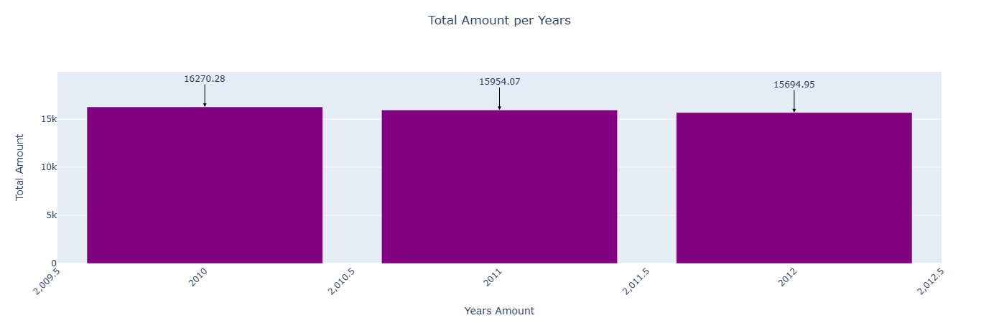

In [20]:
pivot = pd.pivot_table(df, index='years_amount', values='weekly_sales', aggfunc='mean').reset_index()
fig = px.bar(pivot, x='years_amount', y='weekly_sales',
             labels={'weekly_sales': 'Total Amount'},
             title='Total Amount per Years',
             color_discrete_sequence=['purple'])

fig.update_xaxes(title='Years Amount')
fig.update_yaxes(title='Total Amount')
fig.update_layout(xaxis_tickangle=-45, autosize=False)
fig.update_layout(title_x=0.5, title_y=0.95, title_text='Total Amount per Years')

# Menambahkan anotasi
for i, row in pivot.iterrows():
    fig.add_annotation(
        x=row['years_amount'],
        y=row['weekly_sales'],
        text=f"{row['weekly_sales']:.2f}",  
        showarrow=True,
        arrowhead=2,
        arrowcolor='black',
        ax=0,
        ay=-40
    )

fig.show()

- The research will focus on explaining the decrease in sales revenue in 2012, especially considering the previous increase in sales from 2010 to 2011. The aim is to understand the factors contributing to this decline and propose solutions to boost sales once again.

----------------------------------------------------------------------------------------------------------------------------------
- Penelitian ini akan difokuskan pada menjelaskan penurunan pendapatan penjualan pada tahun 2012, terutama mengingat peningkatan penjualan sebelumnya dari tahun 2010 hingga 2011. Tujuannya adalah untuk memahami faktor-faktor yang berkontribusi terhadap penurunan ini dan mengusulkan solusi untuk meningkatkan penjualan.

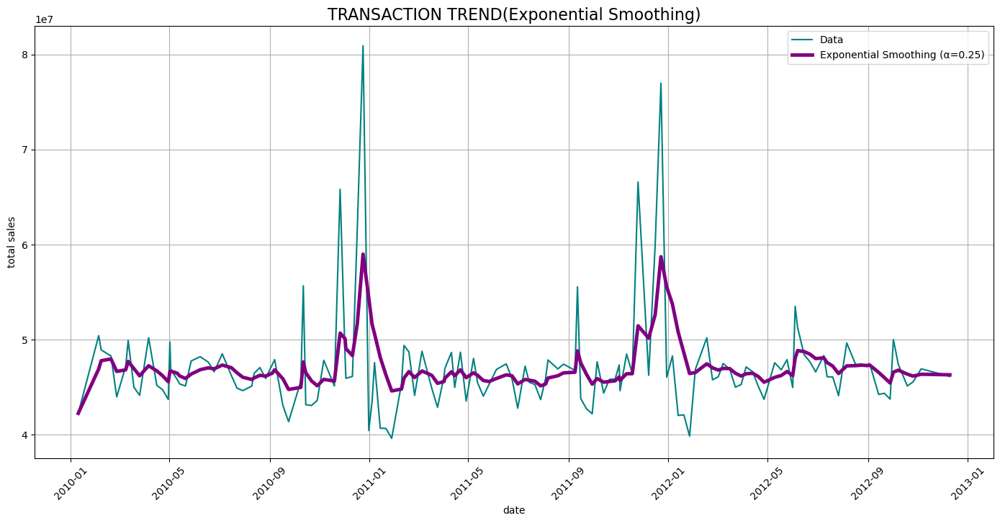

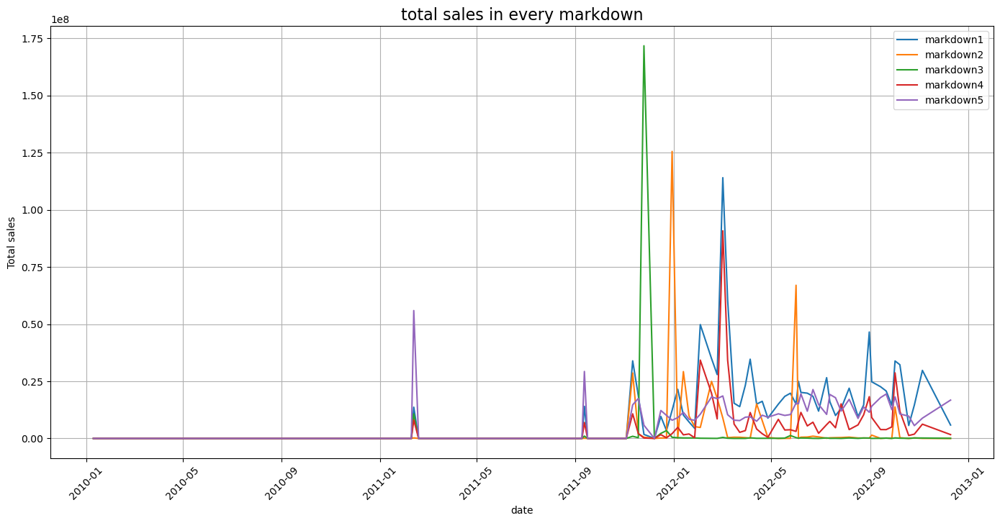

In [21]:
alpha= 0.25
eksponensial = df.groupby(['date'])['weekly_sales'].sum()
ses = pd.Series(eksponensial).ewm(alpha=alpha).mean()

plt.figure(figsize=(14,7))
plt.plot(eksponensial, label='Data', color='teal')
plt.plot(ses, label=f'Exponential Smoothing (α={alpha})', color='purple', linewidth=3.5)
plt.legend()
plt.title('TRANSACTION TREND(Exponential Smoothing)', fontsize = 16)
plt.xlabel('date')
plt.ylabel('total sales')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=45)
plt.savefig('TRANSACTION TREND.png', dpi=300, bbox_inches='tight')
plt.show()

grouped_data = df.groupby('date').agg({'markdown1': 'sum', 'markdown2': 'sum', 'markdown3': 'sum', 'markdown4': 'sum', 'markdown5': 'sum'})

plt.figure(figsize=(14, 7))
for col in grouped_data.columns:
    plt.plot(grouped_data.index, grouped_data[col], label=col)

plt.legend()
plt.title('total sales in every markdown', fontsize=16)
plt.xlabel('date')
plt.ylabel('Total sales')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=45)
plt.savefig('markdown TREND.png', dpi=300, bbox_inches='tight')
plt.show()


- There seems to be a consistent pattern in the data where sales revenue consistently increases during a particular month, typically towards the end of the year.
- An anomaly occurred in the late 2013 period, as sales revenue during this time was lower than in previous years.
- The introduction of markdowns, promotions, and campaigns doesn't appear to significantly impact sales revenue. This could be attributed to the possibility that these promotional efforts aren't particularly appealing to customers.
- The decrease in sales revenue towards the end of 2013 may be attributed to the absence of compelling markdown or promotional events that were previously available during that period.

----------------------------------------------------------------------------------------------------------------------------------
-   Terdapat pola konsisten dalam data di mana pendapatan penjualan secara konsisten meningkat selama bulan tertentu, biasanya menuju akhir tahun.
- Terjadi anomali pada akhir tahun 2013, karena pendapatan penjualan selama periode ini lebih rendah dibandingkan dengan tahun-tahun sebelumnya.
- Pengenalan markdown, promosi, dan kampanye tampaknya tidak berdampak signifikan pada pendapatan penjualan. Ini mungkin disebabkan oleh kemungkinan bahwa upaya promosi ini tidak begitu menarik bagi pelanggan.
- Penurunan pendapatan penjualan menjelang akhir tahun 2013 mungkin dapat diatribusikan pada ketiadaan acara markdown atau promosi yang menarik seperti yang sebelumnya tersedia selama periode tersebut.

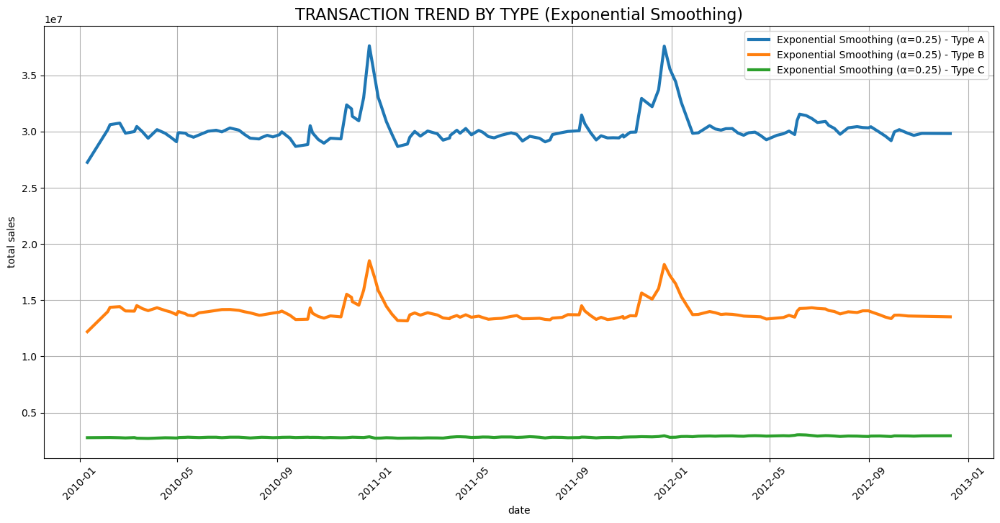

In [22]:
alpha = 0.25
eksponensial = df.groupby(['date'])['weekly_sales'].sum()
ses = pd.Series(eksponensial).ewm(alpha=alpha).mean()

plt.figure(figsize=(14, 7))

for label in ['A', 'B', 'C']:
    type_data = df[df['type'] == label].groupby(['date'])['weekly_sales'].sum()
    ses_type = pd.Series(type_data).ewm(alpha=alpha).mean()
    plt.plot(ses_type, label=f'Exponential Smoothing (α={alpha}) - Type {label}', linewidth=3)

plt.legend()
plt.title('TRANSACTION TREND BY TYPE (Exponential Smoothing)', fontsize = 16)
plt.xlabel('date')
plt.ylabel('total sales')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=45)
plt.savefig('TRANSACTION TREND BY TYPE.png', dpi=300, bbox_inches='tight')
plt.show()

- Let's illustrate the difference in sales revenue between different types by creating a bar chart. This chart will help us visualize the variations in income and trend patterns for each type.

---------------------------------------------------------------------------------------------------------------------------------
- saya akan ilustrasikan perbedaan dalam pendapatan penjualan antara berbagai jenis dengan membuat diagram batang. Grafik ini akan membantu kita memvisualisasikan variasi pendapatan dan pola tren untuk setiap jenisnya.

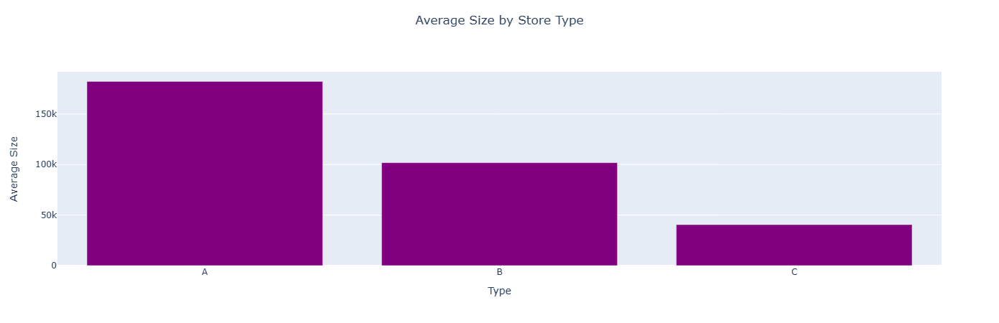

In [23]:
pivot = pd.pivot_table(df, index='type', values='size', aggfunc='mean').reset_index()

fig = px.bar(pivot, x='type', y='size', 
             labels={'size': 'Average Size', 'type': 'Type'},
             title='Average Size by Store Type',
             color_discrete_sequence=['purple'])
fig.update_layout(title_x=0.5, title_y=0.95, title_text='Average Size by Store Type',
                 autosize=False)
fig.show()

- Stores of type A are the largest in size, while type C stores are the smallest. It is likely that the creation of these types is intended to differentiate the sizes of each store.
- After understanding the differences in sales revenue for each type, I'd like to examine whether there are variations in trends for each type.

---------------------------------------------------------------------------------------------------------------------------------
- Toko dengan tipe A adalah yang paling besar dalam ukurannya, sementara tipe C memiliki ukuran yang paling kecil. Kemungkinan, pembuatan tipe-tipe ini dimaksudkan untuk membedakan ukuran dari masing-masing toko.
- Setelah memahami perbedaan dalam pendapatan penjualan untuk setiap jenis, saya ingin memeriksa apakah ada variasi dalam tren untuk setiap type tersebut.

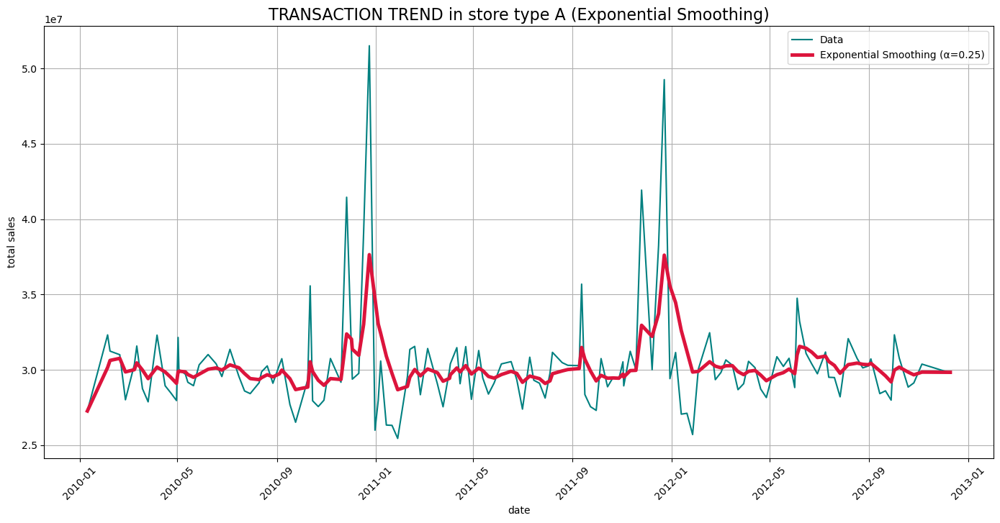

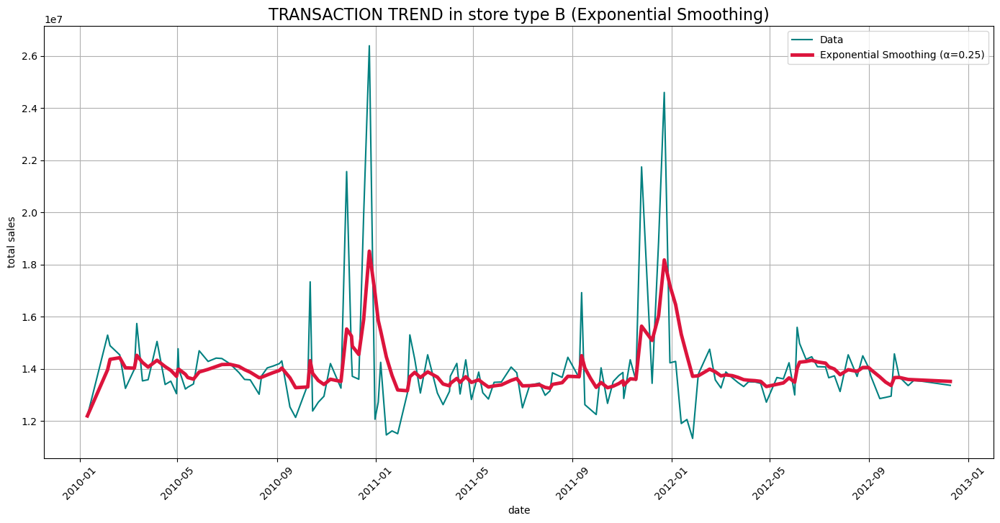

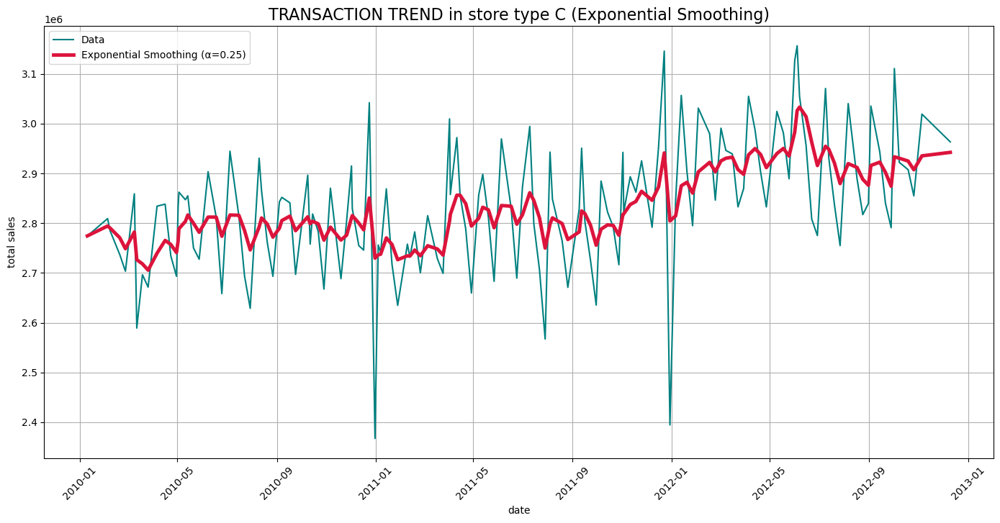

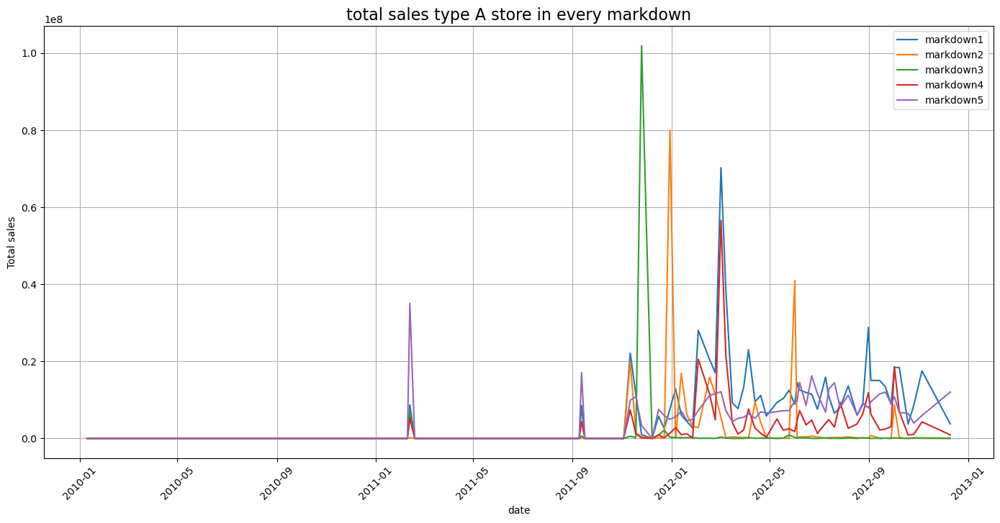

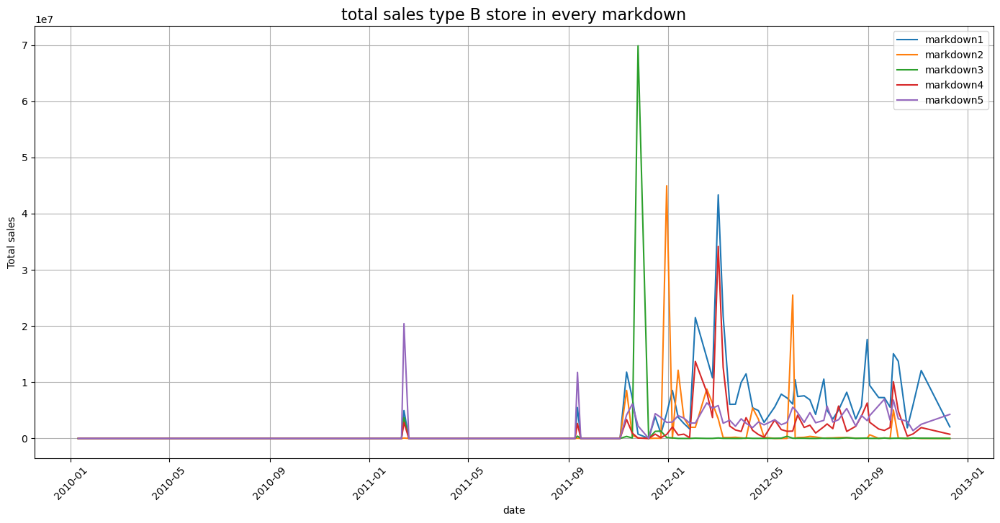

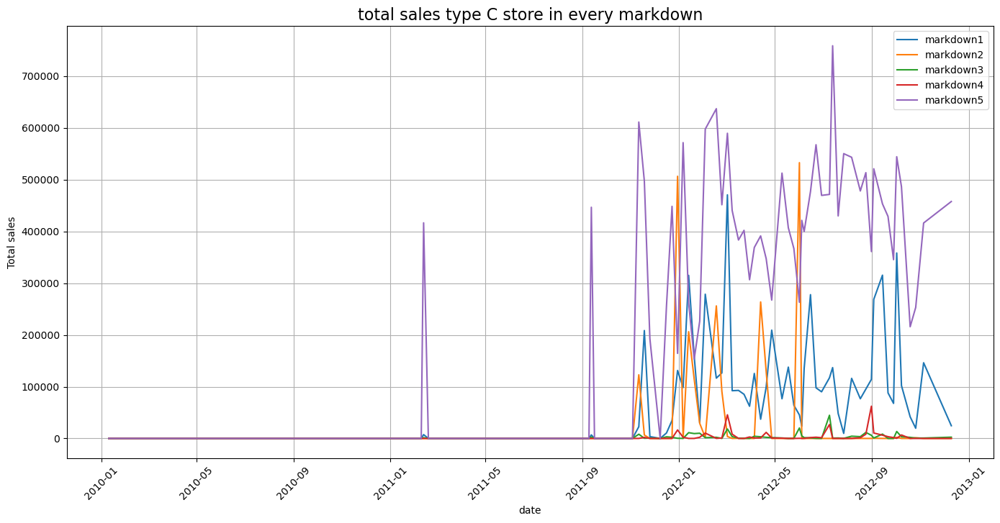

In [24]:
def plot_transaction_trend(df, store_type, alpha=0.25, save_filename=None):
    df_store = df[df['type'] == store_type]
    eksponensial = df_store.groupby('date')['weekly_sales'].sum()
    ses = eksponensial.ewm(alpha=alpha).mean()

    plt.figure(figsize=(14, 7))
    plt.plot(eksponensial, label='Data', color='teal')
    plt.plot(ses, label=f'Exponential Smoothing (α={alpha})', color='crimson', linewidth=3.5)
    plt.legend()
    plt.title(f'TRANSACTION TREND in store type {store_type} (Exponential Smoothing)', fontsize=16)
    plt.xlabel('date')
    plt.ylabel('total sales')
    plt.grid(True)
    plt.tight_layout()
    plt.xticks(rotation=45)

    if save_filename:
        plt.savefig(save_filename, dpi=300, bbox_inches='tight', facecolor='white')
    else:
        plt.show()

def plot_total_sales_by_markdown(df, store_type, save_filename=None):
    df_store = df[df['type'] == store_type]
    grouped_data = df_store.groupby('date')[['markdown1', 'markdown2', 'markdown3', 'markdown4', 'markdown5']].sum()

    plt.figure(figsize=(14, 7))
    for col in grouped_data.columns:
        plt.plot(grouped_data.index, grouped_data[col], label=col)

    plt.legend()
    plt.title(f'total sales type {store_type} store in every markdown', fontsize=16)
    plt.xlabel('date')
    plt.ylabel('Total sales')
    plt.grid(True)
    plt.tight_layout()
    plt.xticks(rotation=45)

    if save_filename:
        plt.savefig(save_filename, dpi=300, bbox_inches='tight', facecolor='white')
    else:
        plt.show()

plot_transaction_trend(df, 'A', save_filename='transaction_trend_A.png')
plot_transaction_trend(df, 'B', save_filename='transaction_trend_B.png')
plot_transaction_trend(df, 'C', save_filename='transaction_trend_C.png')
plot_total_sales_by_markdown(df, 'A', save_filename='total_sales_markdown_A.png')
plot_total_sales_by_markdown(df, 'B', save_filename='total_sales_markdown_B.png')
plot_total_sales_by_markdown(df, 'C', save_filename='total_sales_markdown_C.png')


INSIGHT: 
- Each type exhibits distinct trends.
- Type A shows a sales revenue pattern characterized by a significant increase in the months leading up to the end of the year.
- Type B follows a pattern that is similar to Type A, but with a less pronounced spike in growth.
- Type C displays a different pattern as it remains relatively flat but gradually increases over time.
- Stores with larger sizes tend to generate higher sales revenue.
- Customers tend to shop at larger stores during the months towards the end of the year.
- type C memiliki trend yang cenderung meningkat pada tahun 2012.
- markdown 5 lebih di minati oleh customer di toko type C.
- para customer pada 2012 sudah mulai berpindah dari toko dengan type A dan B menjadi toko dengan type C
- Type C shows a tendency of increasing trend in the year 2012.
- Markdown 5 is more popular among customers in Type C stores.
- Customers began shifting from Type A and Type B stores to Type C stores in 2012.

---------------------------------------------------------------------------------------------------------------------------------

INSIGHT:
- Setiap type memiliki tren yang berbeda.
- type A menunjukkan pola pendapatan penjualan yang ditandai dengan peningkatan signifikan dalam bulan-bulan menjelang akhir tahun.
- type B mengikuti pola yang mirip dengan type A, tetapi dengan lonjakan pertumbuhan yang kurang mencolok.
- type C menampilkan pola yang berbeda karena tetap relatif datar tetapi meningkat secara perlahan seiring waktu.
- Toko dengan ukuran yang lebih besar cenderung menghasilkan pendapatan penjualan yang lebih tinggi.
- Pelanggan cenderung berbelanja di toko-toko yang lebih besar selama bulan-bulan menuju akhir tahun.
- type C menunjukkan kecenderungan tren peningkatan pada tahun 2012.
- Markdown 5 lebih diminati oleh pelanggan di toko-toko type C.
- Pelanggan mulai beralih dari toko-toko type A dan B ke toko-toko type C pada tahun 2012.

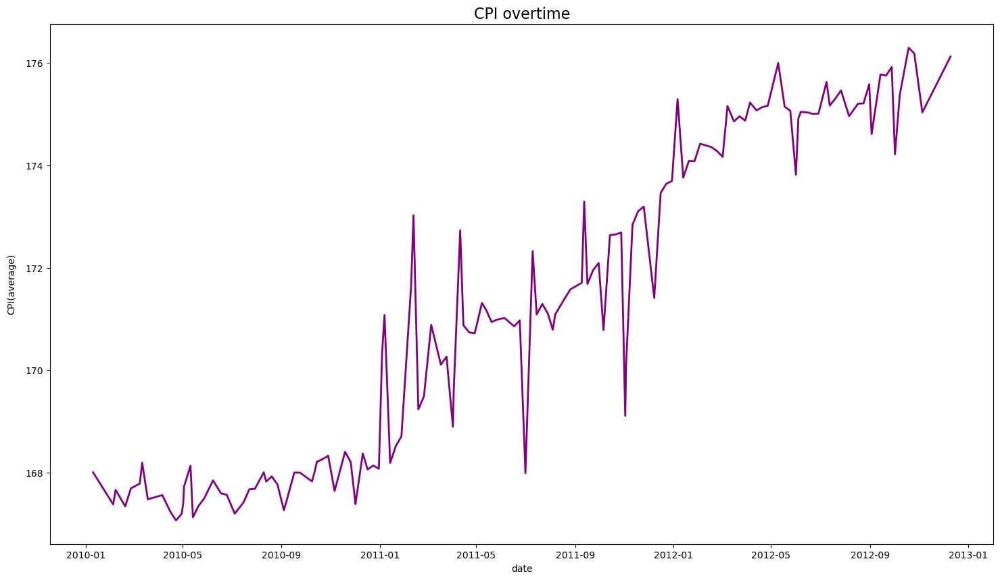

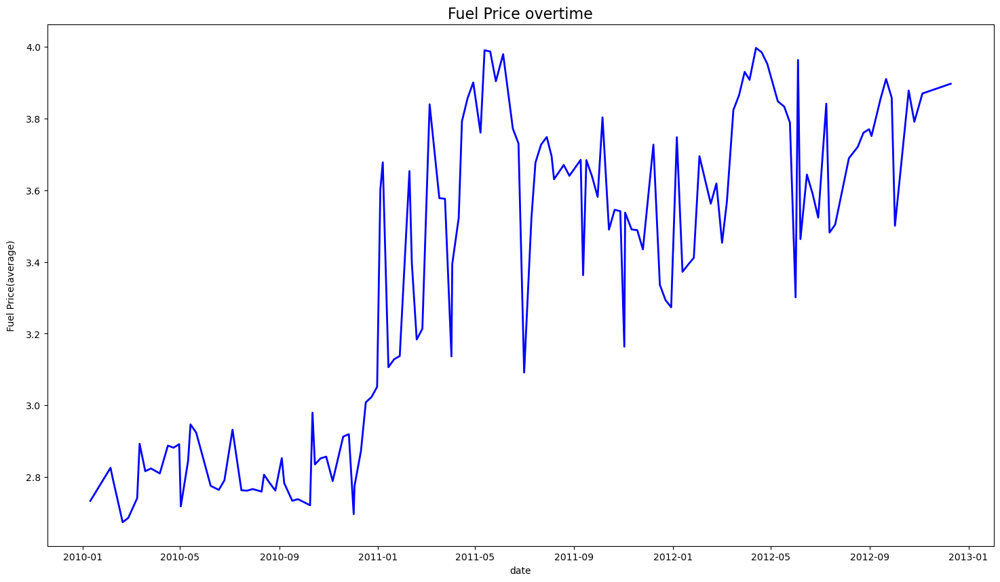

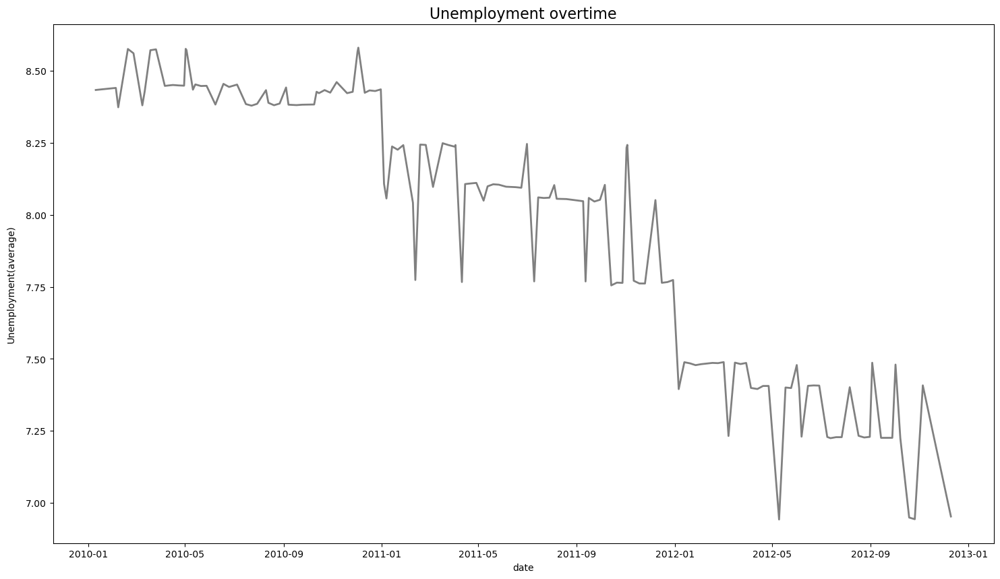

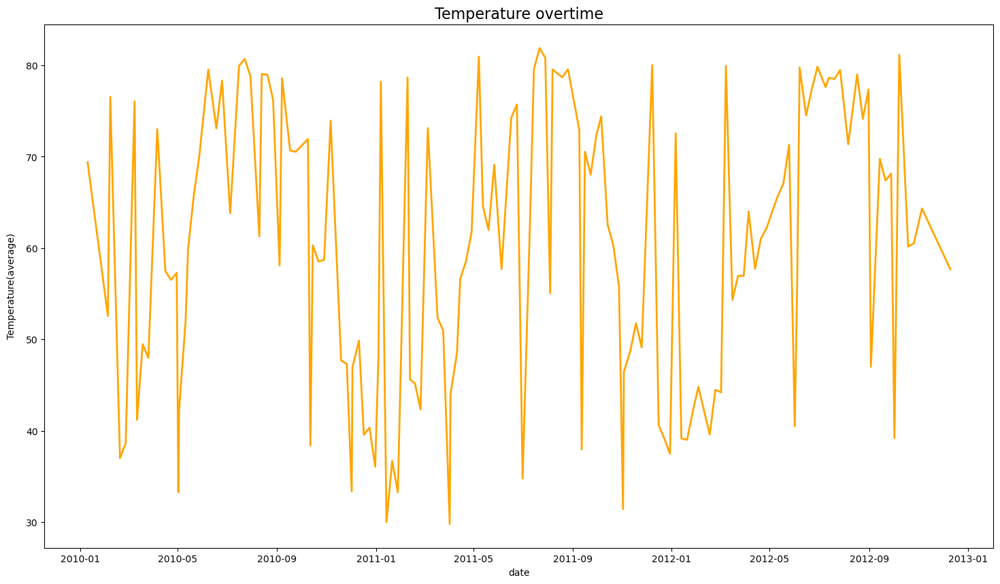

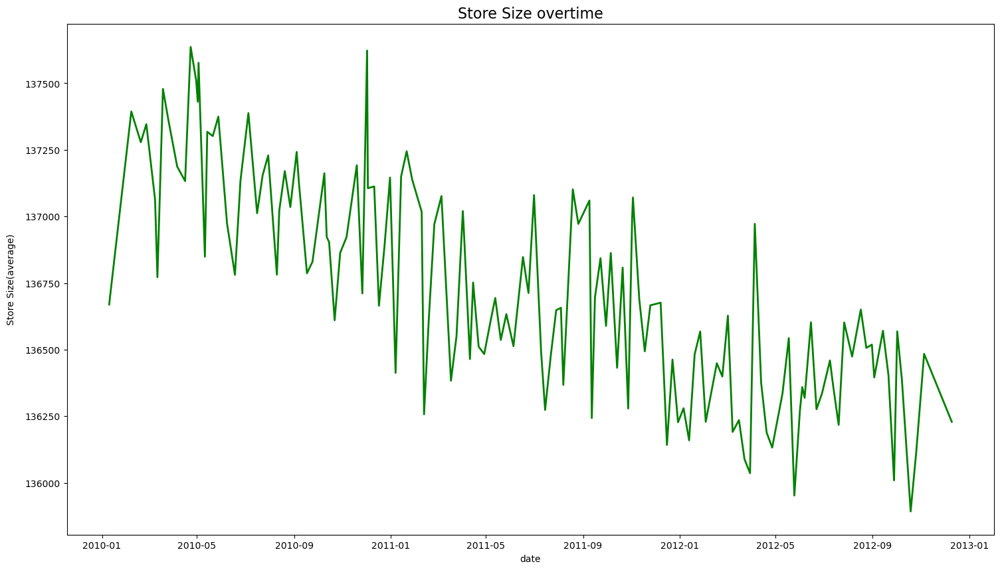

In [25]:
def trend(df, y, title, color, estimator, xlabel, ylabel, save_filename=None):
    plt.figure(figsize=(18, 10))
    sns.lineplot(data=df, x='date', y=y, estimator=estimator, color=color, ci=None, linewidth=2)
    plt.title(title, fontsize=16)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel, labelpad=10)

    if save_filename:
        plt.savefig(save_filename, dpi=300, bbox_inches='tight', facecolor='white')
    else:
        plt.show()

trend(df, 'cpi', 'CPI overtime', 'purple', 'mean', 'date', 'CPI(average)', 'cpi_trend.png')
trend(df, 'fuel_price', 'Fuel Price overtime', 'blue', 'mean', 'date', 'Fuel Price(average)', 'fuel_price_trend.png')
trend(df, 'unemployment', 'Unemployment overtime', 'gray', 'mean', 'date', 'Unemployment(average)', 'unemployment_trend.png')
trend(df, 'temperature', 'Temperature overtime', 'orange', 'mean', 'date', 'Temperature(average)', 'temperature_trend.png')
trend(df, 'size', 'Store Size overtime', 'green', 'mean', 'date', 'Store Size(average)', 'size_trend.png')


INSIGHT:
- The rising CPI levels each year can be an indicator that declining sales may be influenced by the fact that as CPI increases, the prices of the same goods tend to increase from one period to another. This is supported by the fact that high sales revenues were observed at the end of 2010 and 2011, which were influenced by the low CPI levels during the same period, indicating a potential impact.

- As the unemployment rate continues to decrease over time, it doesn't necessarily lead to higher sales revenue. This suggests that, in terms of the overall trend, a decreasing unemployment rate may not necessarily result in an increase in sales revenue.

- The reduction in store size over time could have an influence on sales revenue. It may signify an efficiency effort by the company, but it could also potentially lead to a decrease in sales revenue. This indicates that a decrease in store size over time is expected to have an impact on reducing sales revenue.

- The price of fuel can be considered as one of the indicators of a decrease in sales income. This can be seen when the fuel prices are at a low level, as was the case in 2010 and towards the end of 2011, there was an increase in sales income.

---------------------------------------------------------------------------------------------------------------------------------
INSIGHT:

- Peningkatan tingkat CPI setiap tahun dapat menjadi indikator bahwa penurunan penjualan mungkin dipengaruhi oleh kenaikan harga barang yang sama dari satu periode ke periode lainnya seiring dengan meningkatnya CPI. Hal ini didukung oleh fakta bahwa pendapatan penjualan tinggi teramati pada akhir tahun 2010 dan 2011, yang dipengaruhi oleh tingkat CPI yang rendah selama periode yang sama, mengindikasikan potensi dampaknya.

- Meskipun tingkat pengangguran terus menurun seiring waktu, ini tidak selalu mengarah pada peningkatan pendapatan penjualan. Ini menunjukkan bahwa, dalam hal tren keseluruhan, penurunan tingkat pengangguran tidak selalu menghasilkan peningkatan pendapatan penjualan.

- Penurunan ukuran toko seiring waktu dapat memengaruhi pendapatan penjualan. Hal ini mungkin menunjukkan upaya efisiensi oleh perusahaan, tetapi juga dapat berpotensi menyebabkan penurunan pendapatan penjualan.

- Harga bahan bakar dapat dianggap sebagai salah satu indikator penurunan pendapatan penjualan. Hal ini terlihat ketika harga bahan bakar berada pada tingkat yang rendah, seperti yang terjadi pada tahun 2010 dan menjelang akhir tahun 2011, terjadi peningkatan pendapatan penjualan.

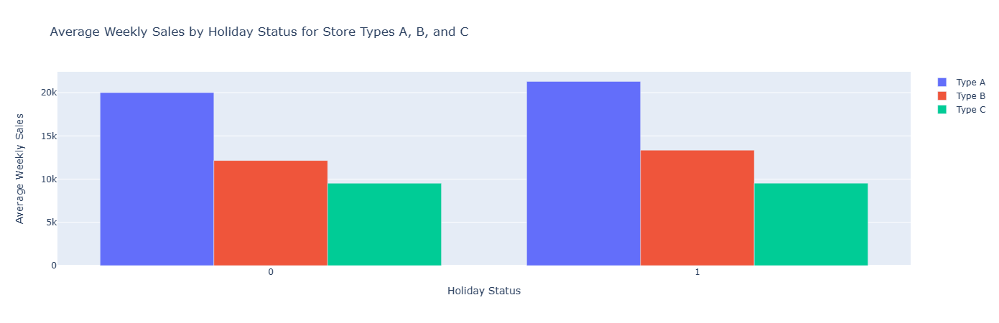

In [26]:
dfa = df[df['type']=='A']
dfb = df[df['type']=='B']
dfc = df[df['type']=='C']
holiday_pivot_a = pd.pivot_table(dfa, index='isholiday_x', values='weekly_sales', aggfunc='mean').reset_index()
holiday_pivot_a
holiday_pivot_b = pd.pivot_table(dfb, index='isholiday_x', values='weekly_sales', aggfunc='mean').reset_index()
holiday_pivot_b
holiday_pivot_c = pd.pivot_table(dfc, index='isholiday_x', values='weekly_sales', aggfunc='mean').reset_index()
holiday_pivot_c

fig = go.Figure()

trace_a = go.Bar(x=holiday_pivot_a['isholiday_x'], y=holiday_pivot_a['weekly_sales'], name='Type A')
fig.add_trace(trace_a)

trace_b = go.Bar(x=holiday_pivot_b['isholiday_x'], y=holiday_pivot_b['weekly_sales'], name='Type B')
fig.add_trace(trace_b)

trace_c = go.Bar(x=holiday_pivot_c['isholiday_x'], y=holiday_pivot_c['weekly_sales'], name='Type C')
fig.add_trace(trace_c)

fig.update_xaxes(title_text='Holiday Status')
fig.update_yaxes(title_text='Average Weekly Sales')
fig.update_layout(title_text='Average Weekly Sales by Holiday Status for Store Types A, B, and C',
                  barmode='group', autosize=False)

fig.show()

- The sales revenue for Type A and Type B stores is higher during holidays compared to weekdays, whereas for Type C stores, it's the opposite.

---------------------------------------------------------------------------------------------------------------------------------
- Pendapatan penjualan untuk toko-toko type A dan type B lebih tinggi selama hari libur dibandingkan dengan hari kerja, sementara untuk toko-toko type C, kebalikannya terjadi.


## 3. SUMMARY

### 3.1 CONCLUSION

- **Variable Relationships:**
Markdown 2 and 3 are associated with holidays, suggesting holiday-related price promotions.
Larger-sized stores tend to host Markdowns 1, 4, and 5 promotional events.

- **Economic Factors:**
A relationship exists between the Consumer Price Index (CPI) and the unemployment rate.
As unemployment increases, CPI tends to decrease, potentially influencing consumer spending.

- **Markdowns and Sales:**
A strong correlation between Markdown 1 and Markdown 4 indicates shared characteristics in these markdown events.
Surprisingly, markdowns and promotions have not significantly impacted sales revenue, possibly due to customer preferences.

- **Sales Decline Investigation:**
The focus of future research should be on understanding the sales revenue decline in 2012, following an increase from 2010 to 2011. Identifying contributing factors and proposing recovery strategies is vital.

- **Seasonal Sales Trends:**
Consistent sales revenue increases occur during specific months, particularly year-end.
An anomaly in late 2013, with lower sales, may be due to the absence of compelling markdown or promotional events.

- **Store Type Differences:**
Store types (A, B, C) exhibit distinct sales trends, with Type A and B showing year-end spikes and Type C having a gradual increase.
Type C attracted customers interested in Markdown 5, with a customer shift observed in 2012.

- **Economic Factors Impact:**
Economic factors (CPI, unemployment, fuel prices) influence sales revenue trends.
Low fuel prices in 2010 and late 2011 coincided with increased sales revenue.

---------------------------------------------------------------------------------------------------------------------------------
- **Hubungan Variabel:**
Markdown 2 dan 3 terkait dengan hari libur, mengindikasikan promosi harga yang terkait dengan liburan.
Toko-toko dengan ukuran yang lebih besar cenderung mengadakan acara promosi Markdown 1, 4, dan 5.

- **Faktor Ekonomi:**
Terdapat hubungan antara Indeks Harga Konsumen (CPI) dan tingkat pengangguran.
Saat tingkat pengangguran meningkat, CPI cenderung menurun, yang dapat memengaruhi pengeluaran konsumen.

- **Markdown dan Penjualan:**
Korelasi yang kuat antara Markdown 1 dan Markdown 4 mengindikasikan adanya karakteristik bersama dalam acara markdown.
markdown dan promosi tidak secara signifikan memengaruhi pendapatan penjualan, mungkin karena preferensi pelanggan.

- **Investigasi Penurunan Penjualan:**
Fokus penelitian mendatang sebaiknya pada pemahaman penurunan pendapatan penjualan pada tahun 2012, setelah peningkatan dari tahun 2010 hingga 2011. Mengidentifikasi faktor-faktor yang berkontribusi dan mengusulkan strategi pemulihan sangat penting.

- **Tren Penjualan Musiman:**
Peningkatan pendapatan penjualan yang konsisten terjadi selama bulan-bulan tertentu, terutama menjelang akhir tahun.
Anomali pada akhir tahun 2013, dengan penjualan yang lebih rendah, mungkin disebabkan oleh ketiadaan acara markdown atau promosi yang menarik.

- **Perbedaan Jenis Toko:**
toko (A, B, C) menunjukkan tren penjualan yang berbeda, dengan type A dan B menunjukkan lonjakan menjelang akhir tahun dan type C memiliki peningkatan yang berangsur-angsur.
type C menarik pelanggan yang tertarik pada Markdown 5, dengan pergeseran pelanggan yang diamati pada tahun 2012.

- **Pengaruh Faktor Ekonomi:**
Faktor-faktor ekonomi (CPI, pengangguran, harga bahan bakar) memengaruhi tren pendapatan penjualan.
Harga bahan bakar rendah pada tahun 2010 dan akhir tahun 2011 bersamaan dengan peningkatan pendapatan penjualan.

### 3.2 POLICY ADVICE

- **Maximize Holiday Promotions:** To capitalize on the increased sales during holidays, the company should create special holiday-specific promotions. This may include targeted promotions for Markdowns 2 and 3 during holiday seasons.

- **Tailor Promotions by Store Size:** Acknowledging that larger stores often run promotions, the company can customize its promotion strategies based on store sizes. Smaller stores can implement promotions that align with their available resources.

- **Monitor Economic Indicators:** It's crucial to keep an eye on trends in the Consumer Price Index (CPI) and unemployment rates as they can impact sales. During periods of CPI growth, consider intelligent pricing strategies to maintain customer purchasing power.

- **Assess Promotion Impact:** Despite introducing markdowns and promotions, their effectiveness seems limited. The company should evaluate how well these campaigns are performing and be open to adjusting the promotion strategy if needed.

- **Investigate 2012 Sales Drop:** Prioritize further research to uncover the reasons behind the drop in sales revenue in 2012. Identify the main contributing factors and create a suitable plan for recovery.

- **Optimize Inventory Management:** Efficient inventory management is crucial, especially during months with consistent sales growth. Ensure there's enough stock available during peak seasons.

- **Explore Compelling Markdowns:** If markdowns haven't had a significant impact, consider more appealing markdown strategies to attract customers. This could involve special offers or additional incentives.

- **Track Store Sizes and Customer Preferences:** Given the observed shift of customers from Type A and B stores to Type C stores, continue to monitor customer preferences and adjust strategies accordingly.

- **Plan Engaging Year-End Promotions:** Recognizing the consistent increase in year-end sales, plan engaging promotions or campaigns to maximize revenue during this period.

- **Monitor Fuel Price Trends:** Keep a close watch on fuel prices and how they influence consumer shopping behavior. Plan promotions or pricing strategies that align with significant fuel price fluctuations.

---------------------------------------------------------------------------------------------------------------------------------
- **Maksimalkan Promosi Selama Hari Libur:** Untuk memanfaatkan peningkatan penjualan selama hari libur, perusahaan sebaiknya membuat promosi khusus yang terkait dengan liburan. Ini dapat mencakup promosi yang ditargetkan untuk Markdown 2 dan 3 selama musim liburan.

- **Sesuaikan Promosi Berdasarkan Ukuran Toko:** Menyadari bahwa toko yang lebih besar seringkali menjalankan promosi, perusahaan dapat menyesuaikan strategi promosi berdasarkan ukuran toko. Toko yang lebih kecil dapat menerapkan promosi yang sesuai dengan sumber daya yang tersedia.

- **Pantau Indikator Ekonomi:** Sangat penting untuk memantau tren Indeks Harga Konsumen (CPI) dan tingkat pengangguran karena hal itu dapat memengaruhi penjualan. Selama periode pertumbuhan CPI, pertimbangkan strategi penetapan harga yang cerdas untuk menjaga daya beli pelanggan.

- **Evaluasi Dampak Promosi:** Meskipun telah memperkenalkan markdown dan promosi, efektivitasnya tampak terbatas. Perusahaan sebaiknya mengevaluasi sejauh mana kampanye-kampanye ini berhasil dan bersedia untuk menyesuaikan strategi promosi jika diperlukan.

- **Investigasi Penurunan Penjualan di Tahun 2012:** Prioritaskan penelitian lebih lanjut untuk mengungkap alasan di balik penurunan pendapatan penjualan pada tahun 2012. Identifikasi faktor-faktor utama yang berkontribusi dan buat rencana pemulihan yang sesuai.

- **Optimalkan Manajemen Inventaris:** Manajemen inventaris yang efisien sangat penting, terutama selama bulan-bulan dengan pertumbuhan penjualan yang konsisten. Pastikan ada cukup stok tersedia selama musim tingginya penjualan.

- **Telusuri Markdown yang Menarik:** Jika markdown belum memiliki dampak signifikan, pertimbangkan strategi markdown yang lebih menarik untuk menarik pelanggan. Ini bisa melibatkan tawaran khusus atau insentif tambahan.

- **Lacak Ukuran Toko dan Preferensi Pelanggan:** Mengingat pergeseran pelanggan dari toko-toko Jenis A dan B ke toko Jenis C yang teramati, terus pantau preferensi pelanggan dan sesuaikan strategi secara sesuai.

- **Rencanakan Promosi Menarik di Akhir Tahun:** peningkatan penjualan yang konsisten menjelang akhir tahun, rencanakan promosi atau kampanye yang menarik untuk memaksimalkan pendapatan selama periode ini.

- **Pantau Tren Harga Bahan Bakar:** Awasi harga bahan bakar dengan cermat dan bagaimana mereka memengaruhi perilaku belanja konsumen. Rencanakan promosi atau strategi penetapan harga yang sejalan dengan fluktuasi harga bahan bakar yang signifikan.


### 3.3 STRATEGY ADVICE

- **Holiday Promotion Strategy:**
Develop targeted holiday promotion campaigns, especially focused on Markdown 2 and 3, to take advantage of the observed correlation between holidays and these markdowns.
Use holiday-specific marketing messages to attract customers during festive seasons.

- **Store Size-Customized Promotions:**
Tailor promotional activities for each store size, with a focus on Markdowns 1, 4, and 5 for larger-sized stores.
Ensure that marketing strategies align with the capacity and resources of smaller stores.

- **Economic Awareness:**
Monitor and respond to changes in CPI and unemployment rates. Adjust pricing and marketing strategies accordingly.
Consider offering flexible pricing or discounts during periods of economic uncertainty to maintain customer loyalty.

- **Effective Markdown Management:**
Reevaluate the effectiveness of markdowns, promotions, and campaigns. If they are not driving sales, consider revamping these strategies to make them more appealing to customers.
Conduct A/B testing of different promotion approaches to identify what resonates best with your target audience.

- **Sales Recovery Plan for 2012 Decline:**
Investigate the reasons behind the decline in sales revenue in 2012. This may involve customer surveys, market research, and competitor analysis.
Develop a comprehensive sales recovery plan that addresses the identified issues and proposes solutions.

- **Optimized Inventory and Seasonal Planning:**
Implement efficient inventory management to meet customer demand during peak sales months.
Plan well in advance for seasonal promotions and ensure that inventory is stocked appropriately.

- **Compelling Year-End Promotions:**
Create engaging year-end promotions to capitalize on the consistent year-end sales increase observed in the data.
Use data-driven insights to design promotions that align with customer preferences and maximize revenue.

- **Store Size Optimization:**
Evaluate the impact of store size reductions on sales revenue. Consider whether the efficiency gains outweigh the potential revenue loss.
Explore ways to make smaller stores more appealing to customers through unique offerings or experiences.

- **Customer Migration Analysis:**
Continue monitoring customer migration patterns, especially the shift from Type A and B stores to Type C stores.
Conduct surveys or focus groups to understand the motivations behind customer migration and tailor marketing efforts accordingly.

- **Fuel Price Sensitivity:**
Stay vigilant regarding fuel price trends and their impact on consumer spending habits.
Consider adjusting pricing or promotions during periods of significant fuel price fluctuations.

---------------------------------------------------------------------------------------------------------------------------------
- **Strategi Promosi Selama Hari Libur:**
Kembangkan kampanye promosi khusus selama hari libur, terutama berfokus pada Markdown 2 dan 3, untuk memanfaatkan korelasi yang diamati antara hari libur dan markdown ini.
Gunakan pesan-pesan pemasaran yang terkait dengan liburan untuk menarik pelanggan selama musim perayaan.

- **Promosi yang Disesuaikan dengan Ukuran Toko:**
Sesuaikan aktivitas promosi untuk setiap ukuran toko, dengan fokus pada Markdowns 1, 4, dan 5 untuk toko yang lebih besar.
Pastikan bahwa strategi pemasaran sesuai dengan kapasitas dan sumber daya toko yang lebih kecil.

- **Kesadaran akan Faktor Ekonomi:**
Pantau dan tanggapi perubahan dalam CPI dan tingkat pengangguran. Sesuaikan penetapan harga dan strategi pemasaran sesuai dengan keadaan ekonomi.
Pertimbangkan untuk menawarkan penetapan harga yang fleksibel atau diskon selama periode ketidakpastian ekonomi untuk menjaga loyalitas pelanggan.

- **Manajemen Markdown yang Efektif:**
Revaluasi efektivitas markdown, promosi, dan kampanye. Jika mereka tidak meningkatkan penjualan, pertimbangkan untuk memperbarui strategi ini agar lebih menarik bagi pelanggan.
Lakukan pengujian A/B dari berbagai pendekatan promosi untuk mengidentifikasi apa yang paling efektif untuk audiens target Anda.

- **Rencana Pemulihan Penjualan untuk Penurunan di Tahun 2012:**
Investigasi alasan di balik penurunan pendapatan penjualan pada tahun 2012. Hal ini mungkin melibatkan survei pelanggan, penelitian pasar, dan analisis pesaing.
Kembangkan rencana pemulihan penjualan yang komprehensif yang mengatasi masalah yang diidentifikasi dan mengusulkan solusi.

- **Manajemen Inventaris yang Dioptimalkan dan Perencanaan Musiman:**
Terapkan manajemen inventaris yang efisien untuk memenuhi permintaan pelanggan selama bulan-bulan penjualan puncak.
Rencanakan dengan baik promosi musiman dan pastikan bahwa inventaris tersedia dengan tepat.

- **Promosi Menarik di Akhir Tahun:**
Buat promosi menarik menjelang akhir tahun untuk memanfaatkan peningkatan penjualan yang konsisten pada akhir tahun yang teramati dalam data.
Gunakan wawasan berbasis data untuk merancang promosi yang sesuai dengan preferensi pelanggan dan memaksimalkan pendapatan.

- **Optimasi Ukuran Toko:**
Evaluasi dampak pengurangan ukuran toko pada pendapatan penjualan. Pertimbangkan apakah efisiensi yang diperoleh lebih besar dari potensi kerugian pendapatan.
Jelajahi cara untuk membuat toko yang lebih kecil lebih menarik bagi pelanggan melalui penawaran atau pengalaman yang unik.

- **Analisis Migrasi Pelanggan:**
Terus pantau pola migrasi pelanggatyperutama pergeseratypei toko Jenis A dan B ke toko Jenis C.
Lakukan survei atau kelompok fokus untuk memahami motivasi di balik migrasi pelanggan dan sesuaikan upaya pemasaran sesuai dengan temuan ini.

- **Sensitivitas Harga Bahan Bakar:**
Tetap waspada terhadap tren harga bahan bakar dan dampaknya terhadap kebiasaan belanja konsumen.
Pertimbangkan untuk menyesuaikan harga atau promosi selama periode fluktuasi

## 4. EXECUTIVE SUMMARY

**Executive Summary**

This analysis provides valuable insights into your business strategy, rooted in data-driven observations, with the potential to enhance decision-making and drive growth. 

**Variable Relationships:** Markdowns 2 and 3 are closely tied to holidays, indicating the impact of holiday-related price promotions. Larger stores are inclined to host Markdowns 1, 4, and 5 promotional events.

**Economic Factors:** A correlation exists between the Consumer Price Index (CPI) and unemployment rates. As unemployment rises, CPI tends to decrease, potentially influencing consumer spending.

**Markdowns and Sales:** Markdown 1 and Markdown 4 show a strong correlation, suggesting similarities in these markdown events. Surprisingly, markdowns and promotions have not significantly impacted sales revenue, possibly due to customer preferences.

**Sales Decline Investigation:** A crucial aspect for future research is understanding the decline in sales revenue in 2012, following growth from 2010 to 2011. Identifying contributing factors and proposing recovery strategies is imperative.

**Seasonal Sales Trends:** Consistent monthly increases in sales revenue, especially towards year-end, are observed. A decline in late 2013 may be attributed to the absence of compelling markdown or promotional events.

**Store Type Differences:** Store types (A, B, C) exhibit distinct sales trends. Types A and B experience year-end spikes, while Type C shows gradual growth. Type C attracts customers interested in Markdown 5, with a customer shift observed in 2012.

**Economic Factors Impact:** Economic factors (CPI, unemployment, fuel prices) influence sales revenue trends. Low fuel prices in 2010 and late 2011 coincide with increased sales revenue.

**Strategy Advice:** To maximize impact:

1. Develop targeted holiday promotions for Markdowns 2 and 3.
2. Customize promotions based on store size.
3. Monitor economic indicators and adjust strategies.
4. Optimize markdown and promotional strategies.
5. Create a comprehensive sales recovery plan for 2012.
6. Implement data-driven inventory and seasonal planning.
7. Design captivating year-end promotions.
8. Evaluate store size changes and customer preferences.
9. Analyze customer migration patterns.
10. Monitor fuel price trends.

**Policy Advice:** Key policies to consider:

1. Maximize Holiday Promotions.
2. Tailor Promotions by Store Size.
3. Monitor Economic Indicators.
4. Assess Promotion Impact.
5. Investigate 2012 Sales Drop.
6. Optimize Inventory Management.
7. Explore Compelling Markdowns.
8. Track Store Sizes and Customer Preferences.
9. Plan Engaging Year-End Promotions.
10. Monitor Fuel Price Trends.

By adopting these data-driven strategies and policies, your business can harness insights to drive growth, enhance customer satisfaction, and make informed decisions in a dynamic market environment. As a data analyst, I'm committed to helping your company navigate these challenges and opportunities effectively.

-----------------------------------------------------------------------------------------------------------------------------------
**Ringkasan Eksekutif**

Analisis ini memberikan wawasan berharga untuk strategi bisnis Anda, berdasarkan pengamatan yang didukung data, dengan potensi untuk meningkatkan pengambilan keputusan dan mendorong pertumbuhan.

**Hubungan Variabel:** Markdown 2 dan 3 erat terkait dengan hari libur, menunjukkan dampak promosi harga terkait liburan. Toko-toko yang lebih besar cenderung menjadi tuan rumah acara promosi untuk Markdown 1, 4, dan 5.

**Faktor Ekonomi:** Terdapat korelasi antara Indeks Harga Konsumen (CPI) dan tingkat pengangguran. Ketika pengangguran meningkat, CPI cenderung turun, berpotensi memengaruhi pola belanja konsumen.

**Markdown dan Penjualan:** Markdown 1 dan Markdown 4 menunjukkan korelasi yang kuat, mengindikasikan kemiripan dalam acara markdown ini. Yang mengejutkan, markdown dan promosi tidak berdampak signifikan pada pendapatan penjualan, mungkin disebabkan oleh preferensi pelanggan.

**Penelitian Penurunan Penjualan:** Aspek penting untuk penelitian masa depan adalah memahami penurunan pendapatan penjualan pada tahun 2012, setelah pertumbuhan dari tahun 2010 hingga 2011. Mengidentifikasi faktor-faktor yang berkontribusi dan mengusulkan strategi pemulihan adalah sangat penting.

**Tren Penjualan Musiman:** Terdapat peningkatan penjualan bulanan yang konsisten, terutama menuju akhir tahun. Penurunan pada akhir tahun 2013 mungkin disebabkan oleh absennya acara markdown atau promosi yang menarik.

**Perbedaan Jenis Toko:** Jenis toko (A, B, C) menunjukkan tren penjualan yang berbeda. Jenis A dan B mengalami lonjakan pada akhir tahun, sementara Jenis C menunjukkan pertumbuhan yang lebih lambat. Jenis C menarik pelanggan yang tertarik pada Markdown 5, dengan pergeseran pelanggan yang diamati pada tahun 2012.

**Dampak Faktor Ekonomi:** Faktor ekonomi (CPI, pengangguran, harga bahan bakar) memengaruhi tren pendapatan penjualan. Harga bahan bakar yang rendah pada tahun 2010 dan akhir 2011 bersamaan dengan peningkatan pendapatan penjualan.

**Saran Strategi:** Untuk memaksimalkan dampak:

1. Kembangkan promosi liburan yang ditargetkan untuk Markdown 2 dan 3.
2. Sesuaikan promosi berdasarkan ukuran toko.
3. Pantau indikator ekonomi dan sesuaikan strategi.
4. Optimalkan strategi markdown dan promosi.
5. Buat rencana pemulihan penjualan yang komprehensif untuk tahun 2012.
6. Implementasikan perencanaan inventaris dan musiman yang didukung data.
7. Desain promosi akhir tahun yang menarik.
8. Evaluasi perubahan ukuran toko dan preferensi pelanggan.
9. Analisis pola migrasi pelanggan.
10. Pantau tren harga bahan bakar.

Dengan mengadopsi strategi dan kebijakan berbasis data ini, bisnis Anda dapat memanfaatkan wawasan untuk mendorong pertumbuhan, meningkatkan kepuasan pelanggan, dan mengambil keputusan yang terinformasi di lingkungan pasar yang dinamis. Sebagai seorang analis data, saya berkomitmen untuk membantu perusahaan Anda menghadapi tantangan dan peluang ini secara efektif.